In [27]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
%matplotlib inline

In [28]:
import pandas as pd
df = pd.read_csv("nyc_taxi.csv",usecols= \
                       ['pickup_latitude', 'pickup_longitude', 'dropoff_latitude','dropoff_longitude', 'passenger_count','tpep_pickup_datetime'])
df.tail()
df.shape

,tpep_pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude
12748981,2015-01-10 19:01:44,2,-73.951988,40.786217,-73.953735,40.775162
12748982,2015-01-10 19:01:44,2,-73.982742,40.728184,-73.974976,40.720013
12748983,2015-01-10 19:01:44,1,-73.979324,40.749550,-73.969101,40.787800
12748984,2015-01-10 19:01:44,1,-73.999565,40.738483,-73.981819,40.737652
12748985,2015-01-10 19:01:45,1,-73.960350,40.766399,-73.968643,40.760777


(12748986, 6)

In [29]:
import numpy as np # linear algebra and Scientific calculation

# let's find pickup and dropoff longitude and latitude range
print(np.min(df['pickup_longitude']), np.min(df['pickup_latitude']))
print(np.max(df['pickup_longitude']), np.max(df['pickup_latitude']))

print(np.min(df['dropoff_longitude']), np.min(df['dropoff_latitude']))
print(np.max(df['dropoff_longitude']), np.max(df['dropoff_latitude']))

-121.92581176757812 0.0
78.66265106201173 404.70001220703125
-740.1666870117188 -9.029156684875488
85.2740249633789 459.5333251953125


In [30]:
from bokeh.models import BoxZoomTool
from bokeh.plotting import figure, output_notebook, show

output_notebook()

NYC = x_range, y_range = ((-74.05, -73.7), (40.6, 40.9))

plot_width  = int(750)
plot_height = int(plot_width//1.2)

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    p.add_tools(BoxZoomTool(match_aspect=True))
    
    return p
    
options = dict(line_color=None, fill_color='blue', size=5)

Loading BokehJS ...

In [31]:
%%time
#from bokeh.tile_providers import STAMEN_TERRAIN
samples = df.sample(n=1000)
p = base_plot()
#p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_longitude'], y=samples['dropoff_latitude'], **options)
show(p)

CPU times: user 845 ms, sys: 22.4 ms, total: 868 ms
Wall time: 885 ms


In [32]:
%%time
options = dict(line_color=None, fill_color='blue', size=1, alpha=0.1)
samples = df.sample(n=100000)
p = base_plot()
p.circle(x=samples['dropoff_longitude'], y=samples['dropoff_latitude'], **options)
show(p)


CPU times: user 1.05 s, sys: 25.4 ms, total: 1.07 s
Wall time: 1.09 s


In [33]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [34]:
%%time
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'dropoff_longitude', 'dropoff_latitude',  ds.count('passenger_count'))
img = tf.shade(agg, cmap=["white", 'darkblue'], how='linear')

CPU times: user 250 ms, sys: 80.3 ms, total: 331 ms
Wall time: 348 ms


In [36]:
import numpy as np

def histogram(x,colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

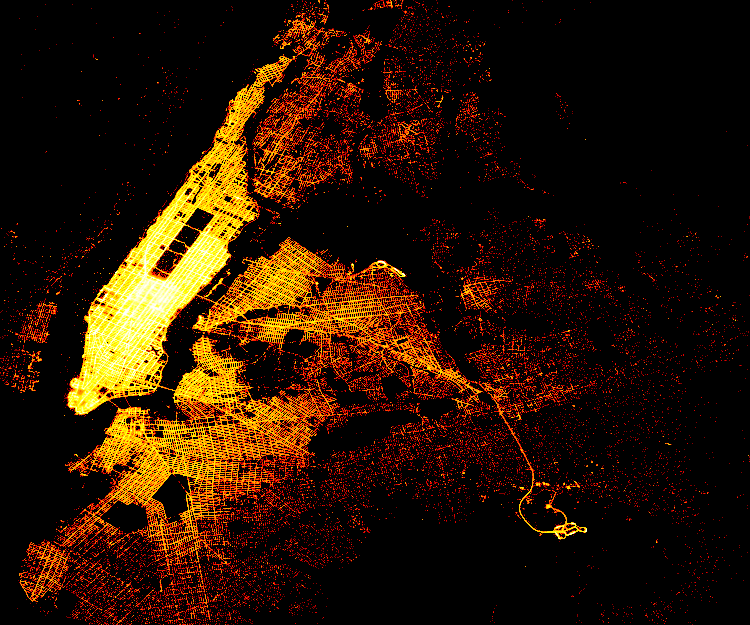

In [41]:
import datashader as ds
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, inferno

background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_longitude', 'dropoff_latitude',  ds.count('passenger_count'))
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

p = base_plot(background_fill_color=background)
export(create_image(*NYC),"NYCT_hot")
InteractiveImage(p, create_image)

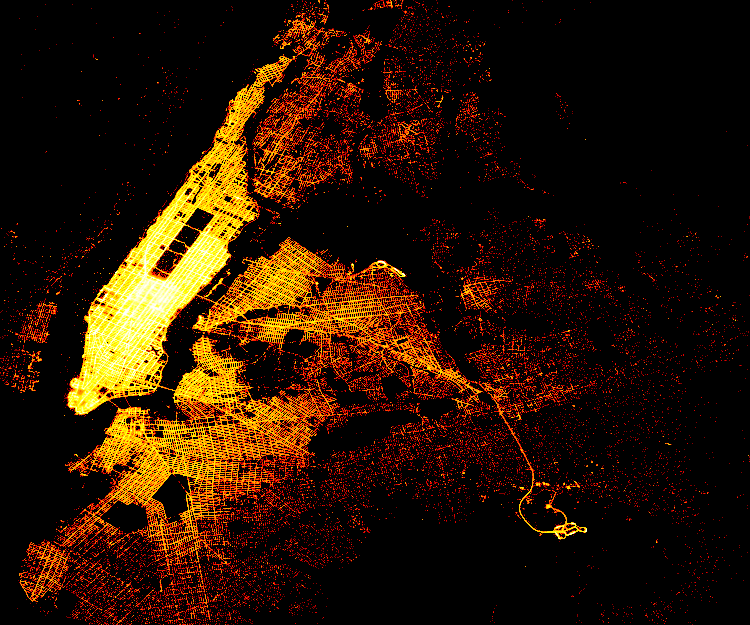

In [44]:
import numpy as np
from functools import partial

def create_image90(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_longitude', 'dropoff_latitude',  ds.count('passenger_count'))
    img = tf.shade(agg.where(agg>np.percentile(agg,90)), cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)
    
p = base_plot()
#p.add_tile(STAMEN_TERRAIN)
export(create_image(*NYC),"NYCT_90th")
InteractiveImage(p, create_image90)

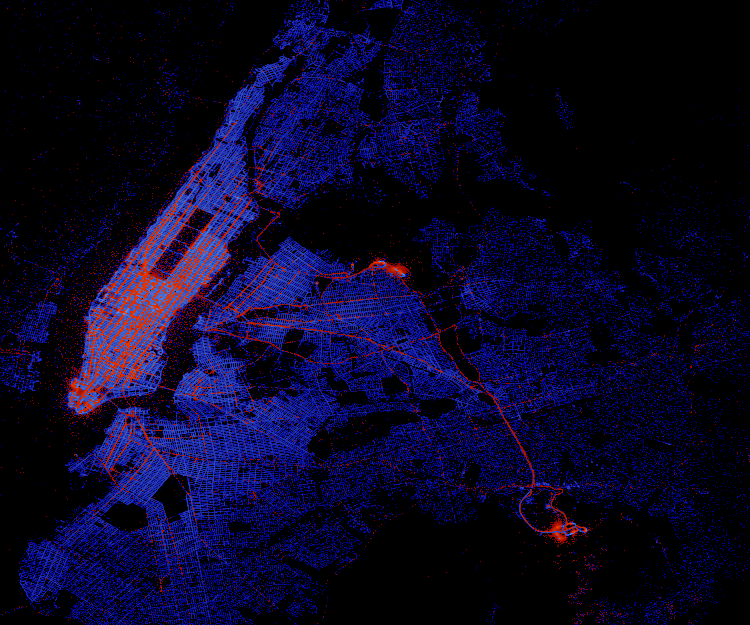

In [45]:
def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    picks = cvs.points(df, 'pickup_longitude',  'pickup_latitude',  ds.count('passenger_count'))
    drops = cvs.points(df, 'dropoff_longitude', 'dropoff_latitude', ds.count('passenger_count'))
    drops = drops.rename({'dropoff_longitude': 'x', 'dropoff_latitude': 'y'})
    picks = picks.rename({'pickup_longitude': 'x', 'pickup_latitude': 'y'})
    more_drops = tf.shade(drops.where(drops > picks), cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(picks.where(picks > drops), cmap=["darkred", 'orangered'], how=how)
    img = tf.stack(more_picks, more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
export(merged_images(*NYC),"NYCT_pickups_vs_dropoffs")
InteractiveImage(p, merged_images)

In [46]:
df['hour'] = pd.to_datetime(df['tpep_pickup_datetime']).dt.hour.astype('category')

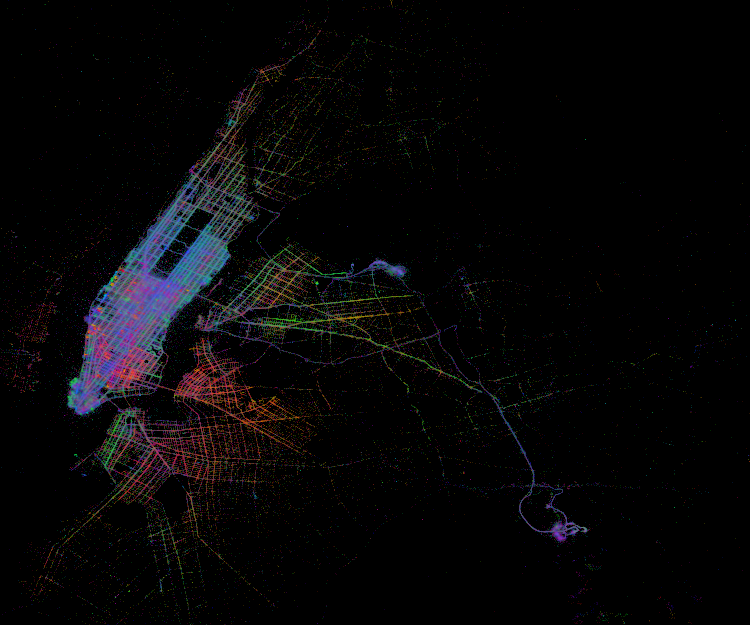

In [47]:
colors = ["#FF0000","#FF3F00","#FF7F00","#FFBF00","#FFFF00","#BFFF00","#7FFF00","#3FFF00",
          "#00FF00","#00FF3F","#00FF7F","#00FFBF","#00FFFF","#00BFFF","#007FFF","#003FFF",
          "#0000FF","#3F00FF","#7F00FF","#BF00FF","#FF00FF","#FF00BF","#FF007F","#FF003F",]

def colorized_images(x_range, y_range, w=plot_width, h=plot_height, dataset="pickup"):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, dataset+'_longitude', dataset+'_latitude', ds.count_cat('hour'))
    img = tf.shade(agg, color_key=colors)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
#p.add_tile(STAMEN_TERRAIN)
export(colorized_images(*NYC, dataset="pickup"),"NYCT_pickup_times")
InteractiveImage(p, colorized_images, dataset="pickup")

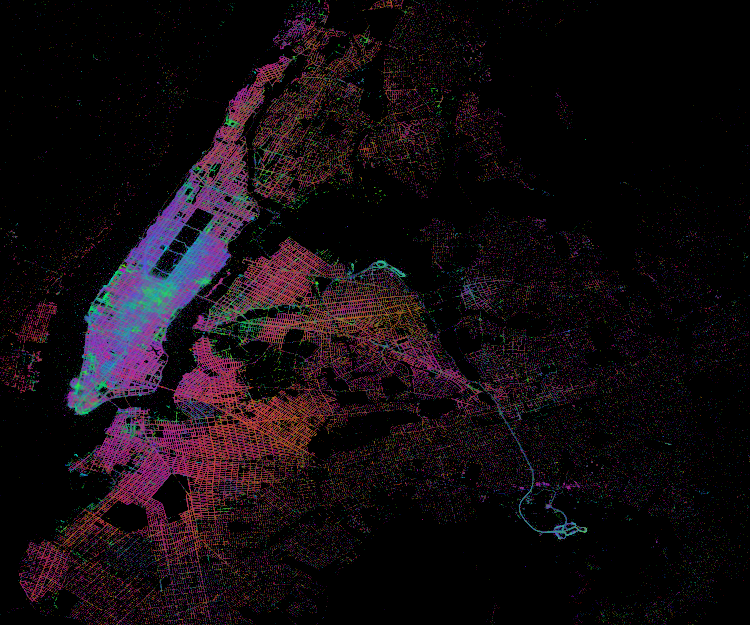

In [48]:
export(colorized_images(*NYC, dataset="dropoff"),"NYCT_dropoff_times")
p = base_plot(background_fill_color=background)
InteractiveImage(p, colorized_images, dataset="dropoff")